In [23]:
import os, sys
import pickle

import matplotlib_inline
sys.path.append("../")

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from matplotlib import gridspec
from matplotlib import ticker

import pysm3
import pysm3.units as u
import healpy as hp

import h5py 


import pymaster as nmt

import seaborn as sns
import numpy as np
from scipy.integrate import simpson, quad, dblquad
from scipy.interpolate import interp1d, make_smoothing_spline
from scipy.optimize import curve_fit
from scipy.stats import binned_statistic

from tqdm import tqdm
from scipy.special import legendre

# import py3nj

import scipy.special as sp
import timeit
import itertools
from joblib import Parallel, delayed
from healpy.projaxes import HistEqNorm


matplotlib_inline.backend_inline.set_matplotlib_formats('retina')

%matplotlib inline
%load_ext autoreload
%autoreload 2
# Load plot settings

from plot_params import params
pylab.rcParams.update(params)

cols_default = plt.rcParams['axes.prop_cycle'].by_key()['color']

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


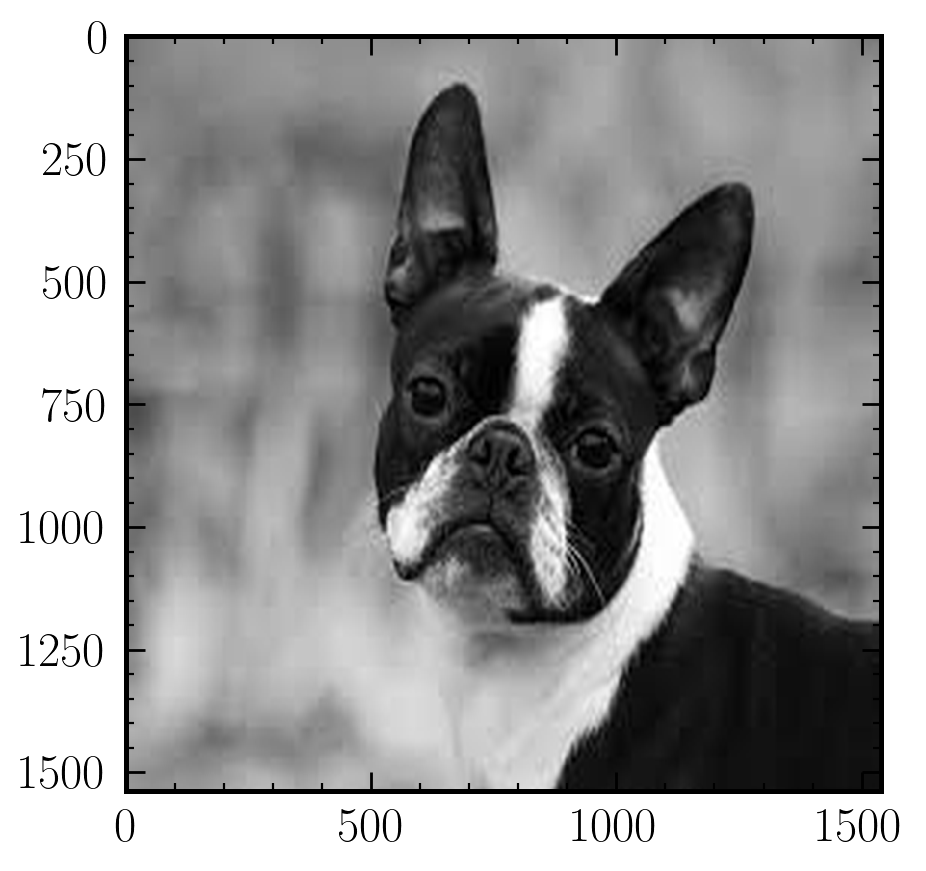

In [2]:
from PIL import Image
img = Image.open('/projectnb/darkcosmo/dark_photon_project/dark_photons_radio_sky/ilc/pres_ilc_images/boston_terrier.jpg')
resized_img = img.resize((1539,1539), Image.Resampling.LANCZOS)
img = np.asarray(resized_img)[:, :, 0]
plt.imshow(resized_img, cmap='plasma')

In [3]:
from functools import partial
def convert_from_healpy(field: np.ndarray) -> np.ndarray:
        """
        Convert a HEALPix map to a Cartesian field.
        This method assumes the field is defined on a HEALPix grid and converts it to a Cartesian field
        using the survey center as the reference point.

        Parameters
        ----------
        field: np.ndarray
            HEALPix map to be converted, should have shape (npix,).

        Returns
        -------
        cartesian_field: np.ndarray
            Cartesian field of the HEALPix map, with shape (dim, dim).
        """
        proj = hp.projector.CartesianProj(
            rot=(196, 42),
            # lonra=[-np.rad2deg(np.max(self.lon)) / 2, np.rad2deg(np.max(self.lon)) / 2],
            # latra=[-np.rad2deg(np.max(self.lat)) / 2, np.rad2deg(np.max(self.lat)) / 2],
            coord="C",
            xsize=1500,
            ysize=1500,
        )
        cartesian_field = proj.projmap(
            field, vec2pix_func=partial(hp.vec2pix, 2048)
        )
        return cartesian_field

In [18]:

nside = 1024
foreground_arrays = []
nu_centers = np.load("/projectnb/darkcosmo/dark_photon_project/21cmfast_cache/pyilc_alt_pt_src_0.1mJy_new_freq/nu_glob.npy") /1e6 * u.MHz
for i, nu in tqdm(enumerate(nu_centers)):
    foreground = hp.read_map(f"/projectnb/darkcosmo/dark_photon_project/21cmfast_cache/pyilc_alt_pt_src_0.1mJy_new_freq/foregrounds_{nu.value/1000:.3f}.fits")
    fig = hp.gnomview(foreground, rot=(196, 42), title=None, return_projected_map=True, no_plot=True, xsize=1500, cmap="RdBu_r", norm="hist", notext=True, cbar=False)
    foreground_arrays.append(fig)
    plt.savefig(f"/projectnb/darkcosmo/dark_photon_project/dark_photons_radio_sky/ilc/pres_ilc_images/foreground_map_{i}.png", bbox_inches="tight", dpi=300)


0it [00:00, ?it/s]

9it [00:53,  5.96s/it]


<Figure size 615.385x500 with 0 Axes>

In [19]:
foreground_arrays = np.array(foreground_arrays)

In [11]:
foreground_arrays[0].shape

(1500, 1500)

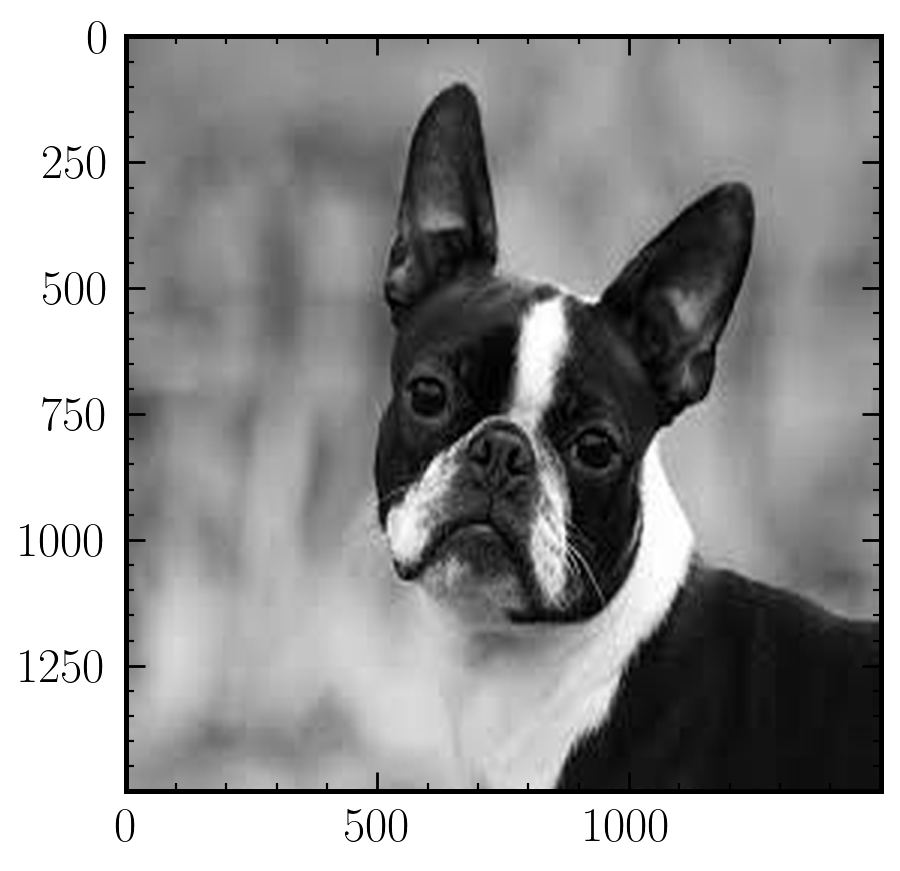

In [12]:
from PIL import Image
img = Image.open('/projectnb/darkcosmo/dark_photon_project/dark_photons_radio_sky/ilc/pres_ilc_images/boston_terrier.jpg')
resized_img = img.resize(( foreground_arrays.shape[1], foreground_arrays.shape[2]), Image.Resampling.LANCZOS)
img = np.asarray(resized_img)[:, :, 0]
plt.imshow(resized_img, cmap='plasma')

In [43]:
def ai(nu):
    # nu is in MHz so let's convert to omega in units of eV
    return 1 / (nu * 6.58212e-10)
fake_dps = np.array([img * ai(nu) /1e11 for nu in nu_centers])

In [44]:
total_maps = foreground_arrays + fake_dps

In [ ]:
plt.imshow(total_maps[-1], cmap="plasma", norm=HistEqNorm())

KeyboardInterrupt: 

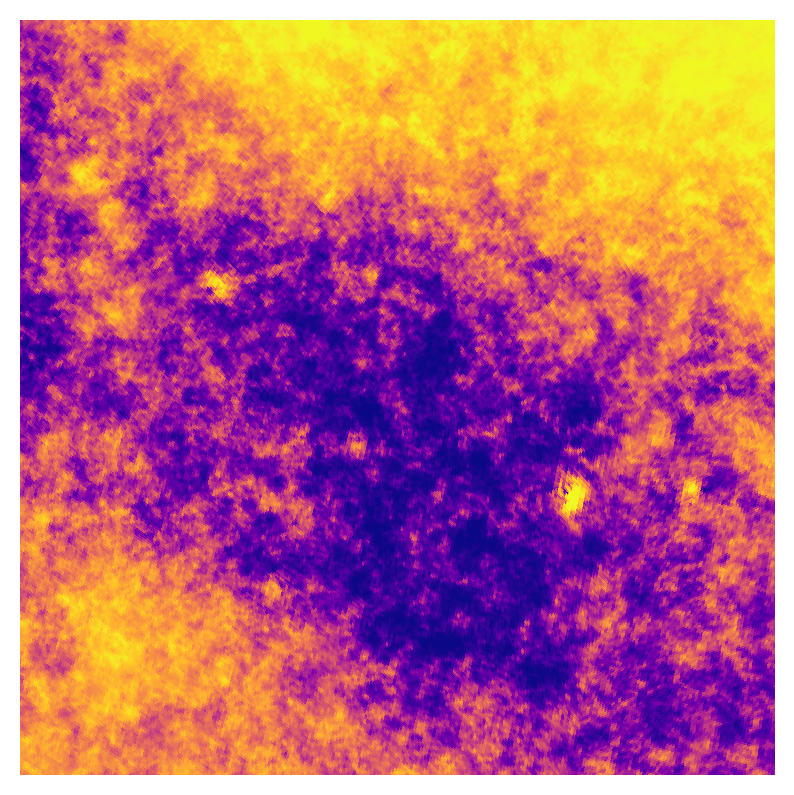

In [31]:
from healpy.projaxes import HistEqNorm

for i, total in enumerate(total_maps):
    # clean_Cls = hp.alm2cl(clean_alms)
    # biased_clean_Cls = clean_Cls.copy()
    # clean_nmt_map = nmt.NmtField(mask=apodized_mask, maps=[clean_map], spin=0)
    plt.imshow(total, cmap="plasma", norm=HistEqNorm())
    plt.axis("off")
    plt.savefig(f"./pres_ilc_images/total_map_{i}.png", dpi=1000, pad_inches=0, bbox_inches="tight")

In [37]:
map_means = np.mean(total_maps, axis=1)
R = np.empty((len(nu_centers), len(nu_centers))) # Initialize the covariance matrix

for i, j in tqdm(itertools.combinations_with_replacement(range(len(nu_centers)), 2)):
    R[i, j] = np.mean((total_maps[i] - map_means[i]) * (total_maps[j] - map_means[j]))
    R[j, i] = R[i, j] # Fill in the symmetric part of the covariance matrix


inv_cov = np.linalg.inv(R)
ai_list = ai(nu_centers / u.MHz)

omega_i = np.einsum("j, ij->i", ai_list, inv_cov) / np.einsum("k, kl, l -> ", ai_list, inv_cov, ai_list)# Compute the weights for each frequency bin
print(omega_i)


45it [00:07,  6.40it/s]

[ 4.39646036e-08 -2.15346166e-06  1.42638452e-05 -3.25478546e-05
  2.48547221e-05  6.31916030e-06 -2.83304876e-05  3.54092293e-05
 -1.80414037e-05]


(-0.5, 1499.5, 1499.5, -0.5)

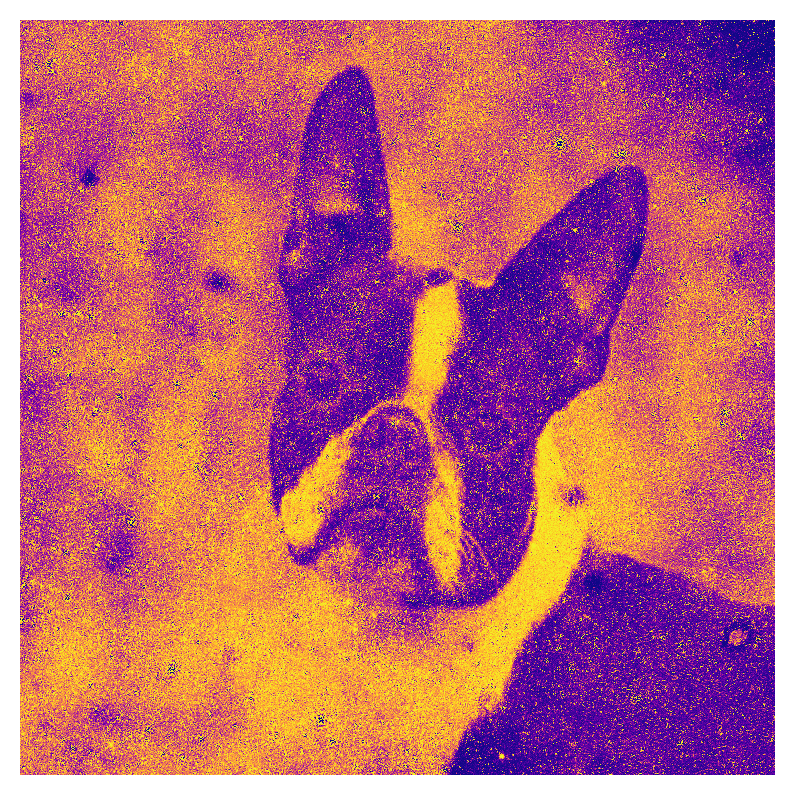

In [38]:
clean_map = np.einsum("i, i... ->...", omega_i, total_maps)
# clean_Cls = hp.alm2cl(clean_alms)
# biased_clean_Cls = clean_Cls.copy()
# clean_nmt_map = nmt.NmtField(mask=apodized_mask, maps=[clean_map], spin=0)
plt.imshow(clean_map, cmap="plasma", norm=HistEqNorm())
plt.axis("off")


  0%|          | 0/9 [00:00<?, ?it/s]

100%|██████████| 9/9 [02:44<00:00, 18.31s/it]


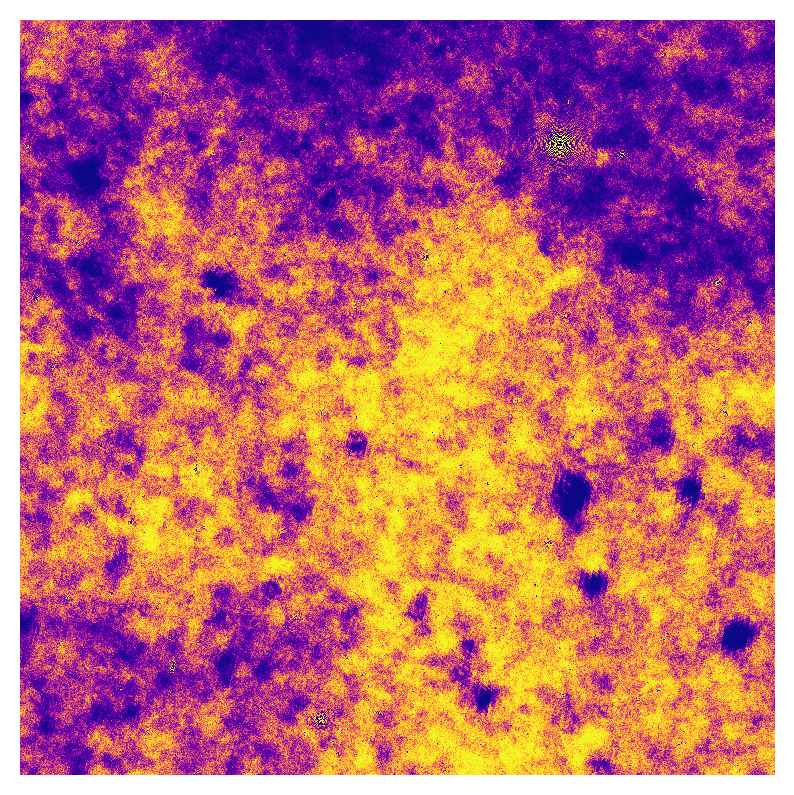

In [84]:
from healpy.projaxes import HistEqNorm

for num in tqdm(range(len(nu_centers))):
    if not os.path.exists(f"./clean_map_{num}.png"):
        clean_map = np.einsum("i, i... ->...", omega_i[:num], total_maps[:num])
        # clean_Cls = hp.alm2cl(clean_alms)
        # biased_clean_Cls = clean_Cls.copy()
        # clean_nmt_map = nmt.NmtField(mask=apodized_mask, maps=[clean_map], spin=0)
        plt.imshow(clean_map, cmap="plasma", norm=HistEqNorm())
        plt.axis("off")
        plt.savefig(f"./pres_ilc_images/clean_map_{num}.png", dpi=1000, pad_inches=0, bbox_inches="tight")

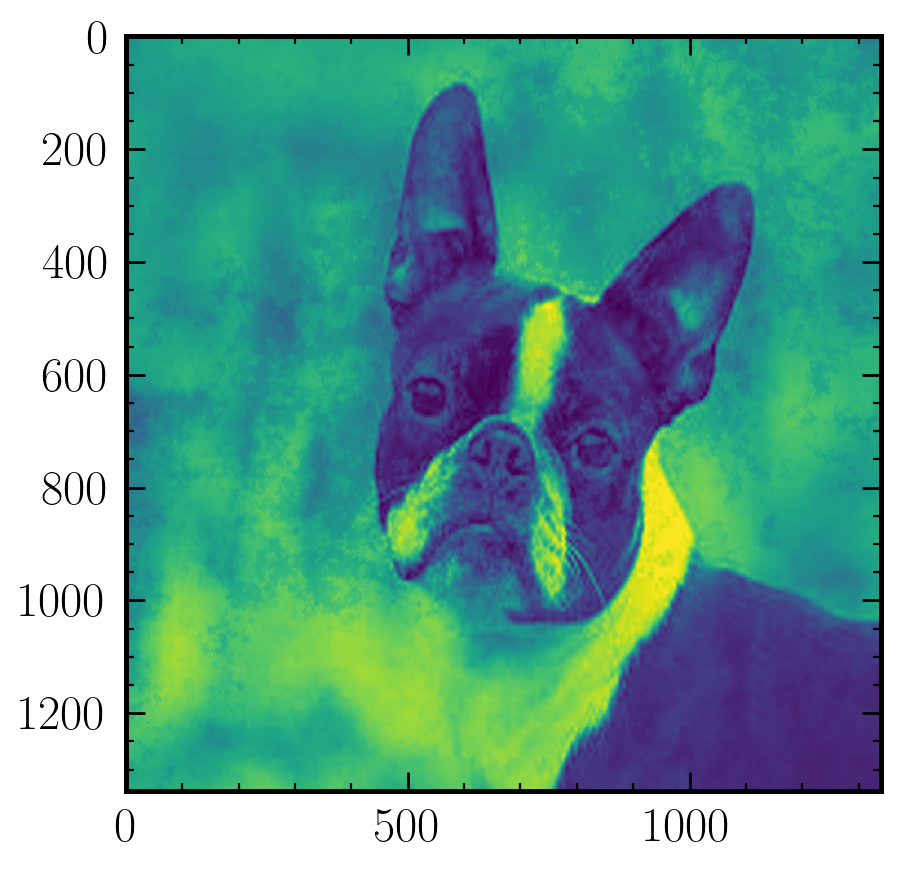

In [92]:
plt.imshow(total_maps[0])

## Dark Photon PS

In [41]:
test_ls = np.concatenate( [[0], np.geomspace(1, 9999, 99, dtype=int)])
ls = np.load("/projectnb/darkcosmo/dark_photon_project/21cmfast_cache/halo_data/correct_virial_mass/ls.npy")
dark_phot_Cls = np.load("/projectnb/darkcosmo/dark_photon_project/21cmfast_cache/halo_data/correct_virial_mass/Cl_PP_mA5.623e-13.npy",) 

# ls, dark_phot_Cls, errs = np.load(f"/home/bakerem/dark_photon_21cm_constraints/halo_data/fd_xis/binned_mean_Cl_mA5.816e-14.npy", )
# dark_phot_Cls[0] = 0

def ai(nu):
    # nu is in MHz so let's convert to omega in units of eV
    return 1 / (nu * 6.58212e-10)

def bi(nu):
    return (130 / nu)**2.07

In [42]:
full_ls = np.arange(3*512)
interp_dp_Cls = interp1d(ls, Tgamma0**2 * dark_phot_Cls, bounds_error=False, fill_value=0) # these have omega=2pi

epsilon =  1e-6
dp_map_no_eps_no_w = hp.sphtfunc.synfast(interp_dp_Cls(full_ls), nside=nside)
dp_maps = np.array([dp_map_no_eps_no_w * ai(nu) * epsilon**2 for nu in tqdm(nu_centers / u.MHz)])
# dp_maps = np.array([hp.remove_monopole(dp_map) for dp_map in dp_maps])
# test_Cls = hp.sphtfunc.anafast(dp_maps[4],)

# plt.loglog(ls, dark_phot_Cls * ai(30_000)**2 * epsilon**4 * Tgamma0**2, label=r"Input $C_\ell$")
# plt.xlabel(r"$\ell$")
# plt.ylabel(r"$C_\ell \langle T_{\gamma \to A'}\rangle^2 $ [mK$^2$]")
# # plt.errorbar(np.arange(test_Cls.shape[0]), test_Cls, yerr= np.sqrt(2* test_Cls**2 / (2*np.arange(test_Cls.shape[0]) + 1)), capsize=2)
# plt.legend();
# plt.xlim(10, 1000)


100%|██████████| 9/9 [00:04<00:00,  2.16it/s]


In [44]:
print(np.std(dp_maps, axis=1))

[4.09340793e-04 2.99695938e-04 2.17960682e-04 1.59837833e-04
 1.17363444e-04 3.39736286e-05 2.49005527e-05 1.82622116e-05
 1.33942318e-05]


## ILC

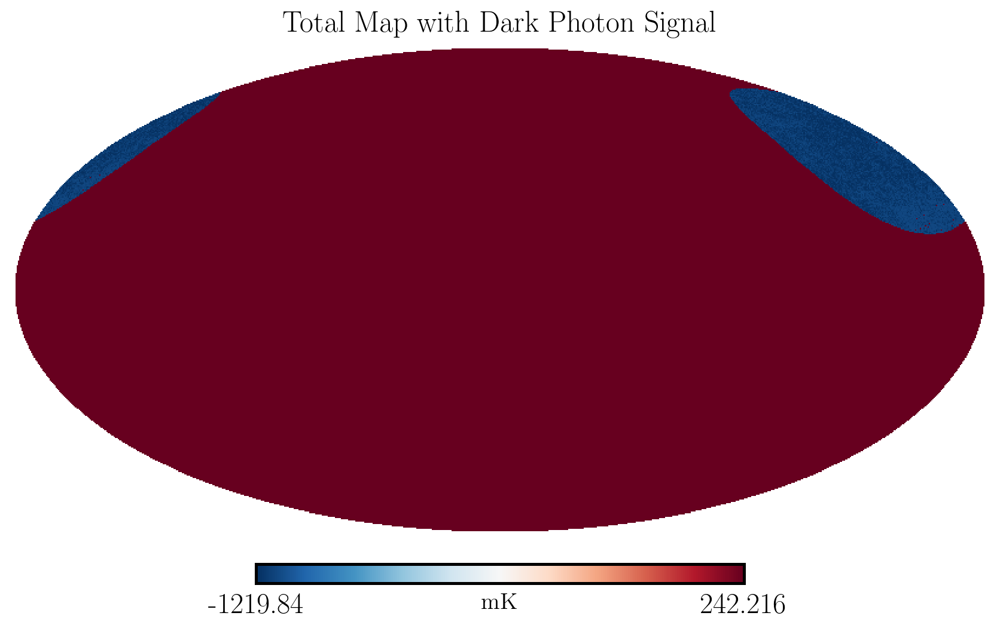

In [6]:
# initialize maps
total_map = np.sum([foregrounds, dp_maps], axis=0) #* u.mK_CMB

# smooth with beam 
FWHM =  np.radians(20/3600)
# total_map = np.array([hp.smoothing(total_map[i, :], fwhm=np.radians(FWHM)) for i in range(len(nu_centers))]) 
total_map = np.array([hp.remove_monopole(map) for map in total_map])


# define patch that we care about, centered at coordinates from LOFAR paper
vec = hp.ang2vec(np.radians(48), np.radians(196))
disk = hp.query_disc(nside, vec, np.radians(25))# 
bool_map = np.ones(hp.nside2npix(nside), dtype=bool)
bool_map[disk] = False


# mask out the point sources inside this disk


apodized_mask = nmt.mask_apodization(~bool_map, aposize=0, apotype="C2")
total_nmt_maps = np.array([nmt.NmtField(mask=apodized_mask, maps=[total_map[i]], spin=0) for i in range(len(nu_centers))])
fsky = disk.shape[0] / hp.nside2npix(nside)



dirty_alms = np.array([total_nmt_maps[i].get_alms()[0] for i in range(len(nu_centers))]) # Compute the alms for each frequency
hp.mollview(total_map[4]*apodized_mask, title="Total Map with Dark Photon Signal", unit=r"mK", cmap="RdBu_r", norm="hist")
plt.show()

In [7]:
# binning = nmt.NmtBin.from_nside_linear(nside, 10)
# dirty_Cls = np.array([binning.unbin_cell(nmt.compute_full_master(total_nmt_maps[i], total_nmt_maps[i], b=binning)[0]) for i in tqdm(range(len(nu_centers)))])

In [8]:
R =  np.empty(( 3*nside, len(nu_centers), len(nu_centers))) # Initialize the covariance matrix

for i, j in tqdm(itertools.combinations_with_replacement(range(len(nu_centers)), 2)):
    R[:, i, j] = hp.sphtfunc.anafast(total_map[i] * apodized_mask, total_map[j] * apodized_mask) * (2 * np.arange(0, 3*nside) + 1) / 4 /np.pi# Compute the angular power spectrum for each pair of frequencies
    R[:, j, i] = R[:, i, j] # Fill in the symmetric part of the covariance matrix

45it [52:36, 70.14s/it]


In [21]:
map_means.shape

(9,)

In [22]:
map_means = np.mean(total_map * apodized_mask, axis=1)
R = np.empty((len(nu_centers), len(nu_centers))) # Initialize the covariance matrix

for i, j in tqdm(itertools.combinations_with_replacement(range(len(nu_centers)), 2)):
    R[i, j] = np.mean((total_map[i] * apodized_mask - map_means[i]) * (total_map[j] * apodized_mask - map_means[j]))
    R[j, i] = R[i, j] # Fill in the symmetric part of the covariance matrix

45it [00:10,  4.29it/s]


In [24]:
inv_cov.shape

(9, 9)

In [30]:
N = 15
inv_cov = np.linalg.inv(R)
ai_list = ai(nu_centers / u.MHz)

omega_i = np.einsum("j, ij->i", ai_list, inv_cov) / np.einsum("k, kl, l -> ", ai_list, inv_cov, ai_list)# Compute the weights for each frequency bin
print(omega_i)


[ 1.81510115e-07 -5.13310047e-07 -3.17602951e-07  1.42231328e-07
  2.68118391e-06 -8.25634669e-06 -2.45456178e-05  6.70904284e-05
 -3.07370436e-05]


In [43]:
dp_maps

array([[  51.16369231,  376.92205274, -336.04970731, ..., -126.38978563,
        -293.27193502, -162.46990807],
       [  37.45913187,  275.96078861, -246.03639285, ...,  -92.53537876,
        -214.71695242, -118.95118269],
       [  27.243005  ,  200.69875536, -178.93555844, ...,  -67.29845728,
        -156.15778358,  -86.50995105],
       ...,
       [   3.11233143,   22.92849282,  -20.44219288, ...,   -7.68839942,
         -17.83998418,   -9.88318432],
       [   2.28260216,   16.81589136,  -14.99242437, ...,   -5.63871731,
         -13.08394922,   -7.24838545],
       [   1.67415114,   12.33344307,  -10.9960399 , ...,   -4.13565939,
          -9.59628838,   -5.31625398]])

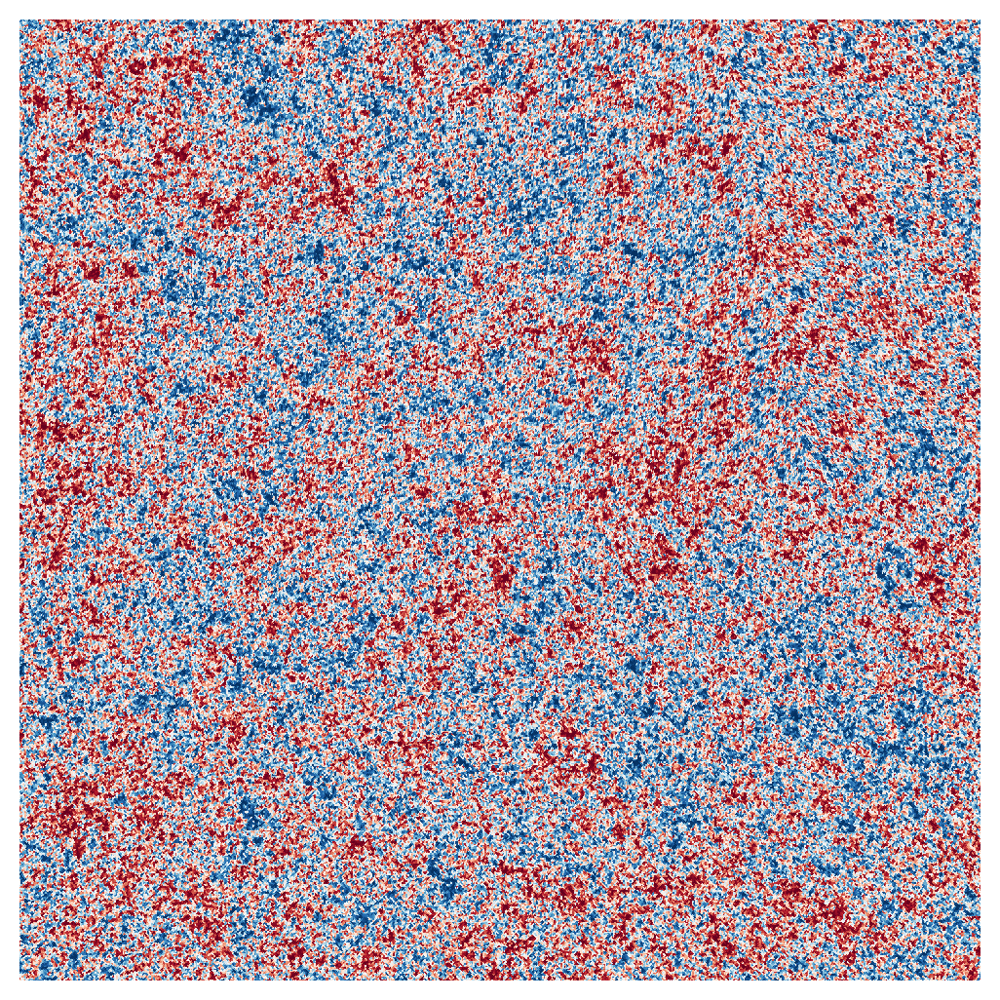

In [ ]:
plot_dirty = dp_maps[0].copy()
plot_dirty[bool_map] = np.nan
hp.gnomview(plot_dirty, rot=(196, 42), title=None, xsize=1500, cmap="RdBu_r", norm="hist", notext=True, cbar=False)
plt.axis("off")
plt.savefig(f"./dp_map.png", dpi=1000, pad_inches=0, bbox_inches="tight")


In [ ]:
for num in tqdm(range(1,len(nu_centers))):
    if not os.path.exists(f"./clean_map_{num}.png"):
        clean_map = np.einsum("i, ij ->j", omega_i[:num], total_map[:num])
        plot_map = clean_map.copy()
        plot_map[bool_map] = np.nan
        # clean_Cls = hp.alm2cl(clean_alms)
        # biased_clean_Cls = clean_Cls.copy()
        # clean_nmt_map = nmt.NmtField(mask=apodized_mask, maps=[clean_map], spin=0)
        hp.gnomview(plot_map, rot=(196, 42), title=None, xsize=1500, cmap="RdBu_r", norm="hist", notext=True, cbar=False)
        plt.axis("off")
        plt.savefig(f"./clean_map_{num}.png", dpi=1000, pad_inches=0, bbox_inches="tight")

In [ ]:
clean_map = hp.sphtfunc.alm2map(clean_alms, nside=nside) # Compute the cleaned map from the cleaned alms
# clean_noise_map = hp.sphtfunc.alm2map(clean_noise_alms, nside=nside) # Compute the cleaned noise map from the cleaned noise alms
plot_map = clean_map.copy()
plot_map[bool_map] = np.nan
# clean_map[bool_map] = hp.UNSEEN
# plot_map[bool_map] = np.nan
clean_Cls = hp.alm2cl(clean_alms)
biased_clean_Cls = clean_Cls.copy()
clean_nmt_map = nmt.NmtField(mask=apodized_mask, maps=[clean_map], spin=0)
binning = nmt.NmtBin.from_nside_linear(nside, 10)
clean_Cls = nmt.compute_full_master(clean_nmt_map, clean_nmt_map, b=binning)[0]

# clean_Cls = hp.alm2cl(clean_alms)
# clean_noise_Cls = hp.sphtfunc.alm2cl(clean_noise_alms)

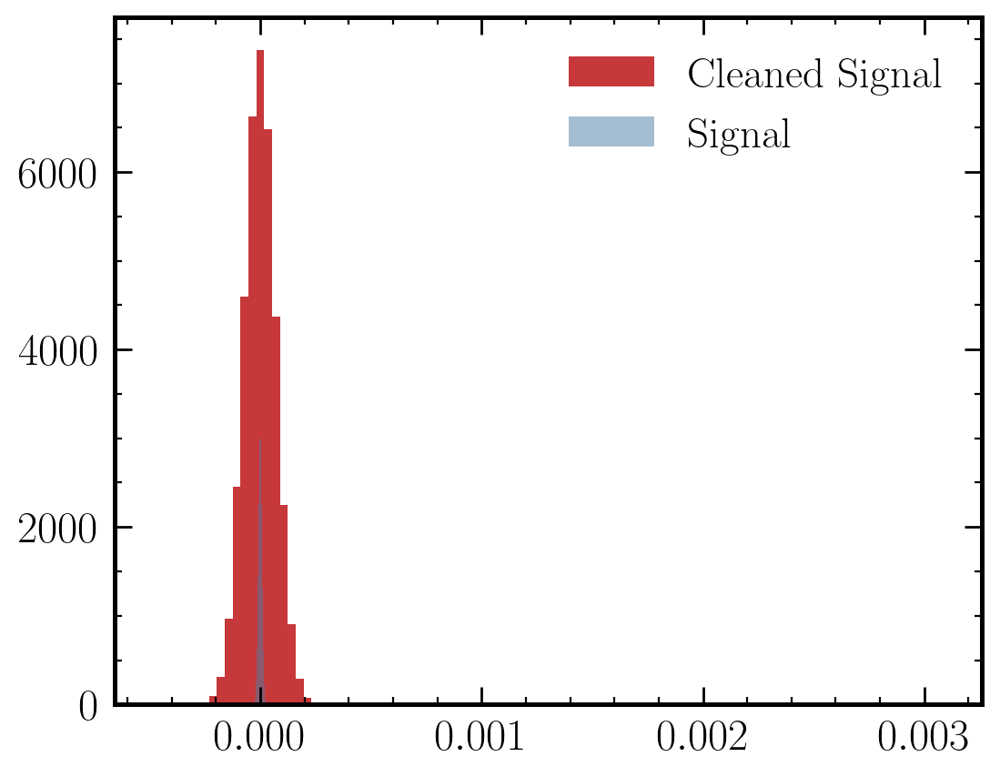

In [ ]:
# plot_map[bool_map] = np.nan
plt.hist(plot_map, bins=100, label="Cleaned Signal")
plt.hist(dp_maps[4] / ai(nu_centers[4]), bins=1000, alpha=0.5,  label="Signal")

plt.legend()

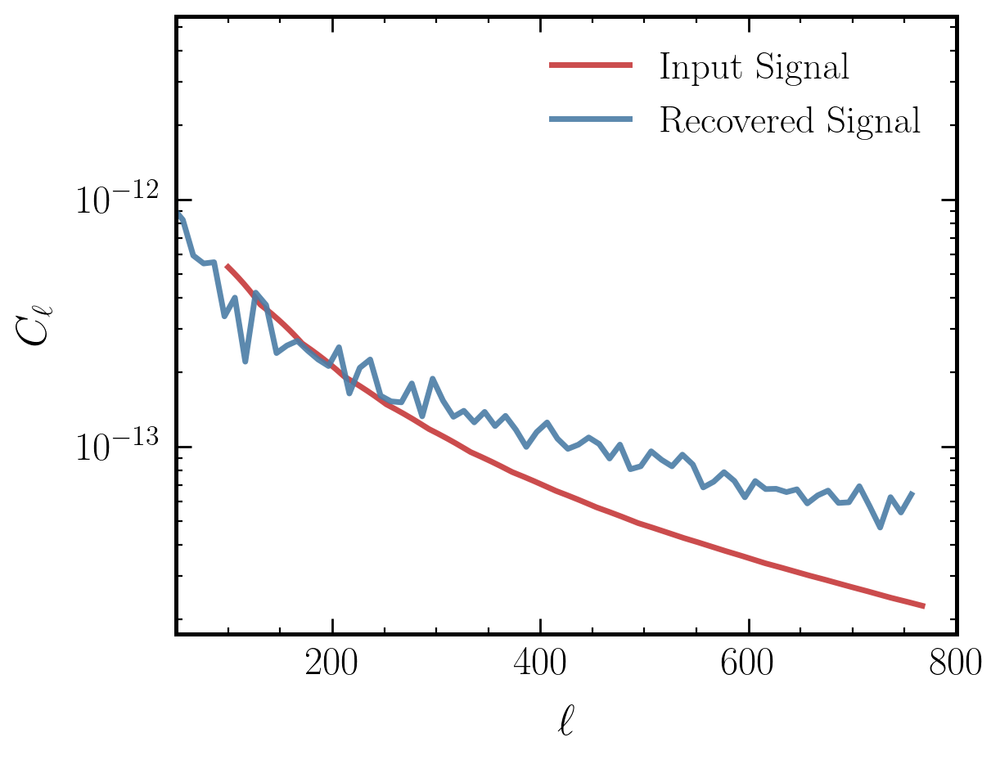

In [ ]:

plt.semilogy(full_ls[100:],interp_dp_Cls(full_ls[100:]) * 1.4e-6**4 , label="Input Signal")
plt.semilogy(binning.get_effective_ells(), clean_Cls, label="Recovered Signal")
# plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * biased_clean_Cls, label="Biased Result")
# 
# plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * dirty_total_Cl, label="Original Map")
plt.xlim(50, 800)

# plt.ylim(1e-14, 1e-10)
plt.xlabel(r"$\ell$")
plt.ylabel(r"$C_\ell$")
plt.legend()
# plt.savefig("cleaned_CL.png", dpi=1000, bbox_inches="tight")

[1.50693262e-06]
[[2.33106008e-07]]


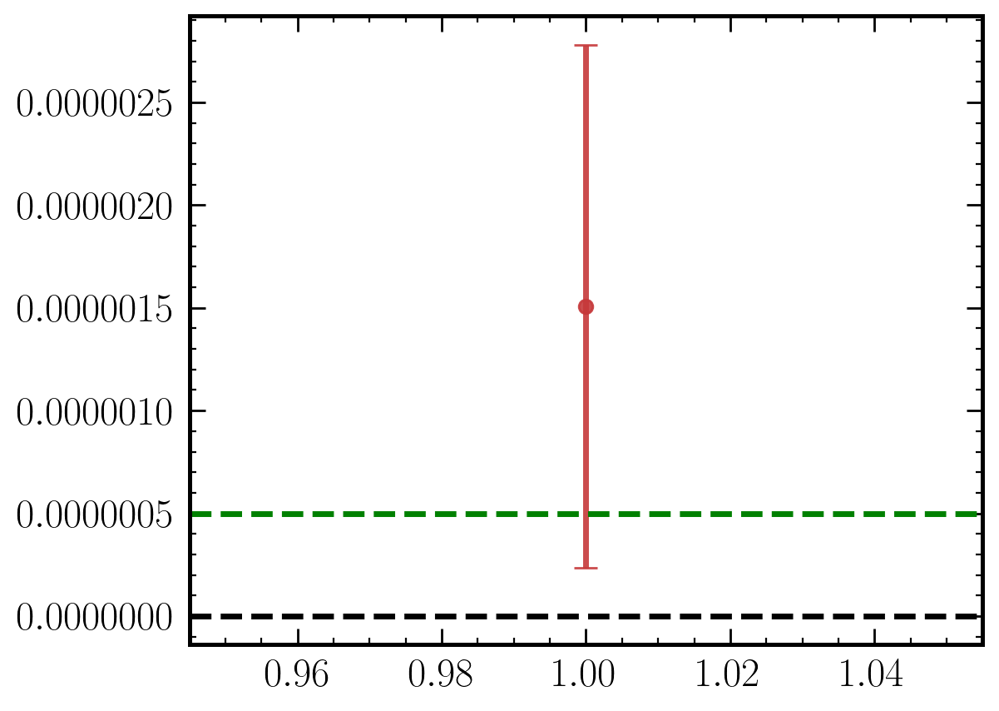

In [ ]:
# Cl_var_clean = 2 / ( 2* full_ls + 1) * clean_Cls**2 / fsky  
eff_ells = binning.get_effective_ells()
l_cut = (eff_ells>200) & (eff_ells<800)

popt, pcov = curve_fit(lambda l, eps4: eps4 * interp_dp_Cls(l) , eff_ells[l_cut], clean_Cls[l_cut],)   

print((popt)**0.25)
print((popt)**0.25 - 2 * (pcov)**0.125)
plt.errorbar([1], popt**0.25, yerr=2*pcov**0.125, fmt="o", capsize=5 )
plt.axhline(epsilon, color="g", linestyle="--")
plt.axhline(0, color="k", linestyle="--")
# plt.yscale("log")

'/usr3/graduate/ebaker/dark_photon_constraints/ilc'

Text(0, 0.5, '$\\ell(\\ell+1)C_\\ell/2\\pi$ [K$^2$]')

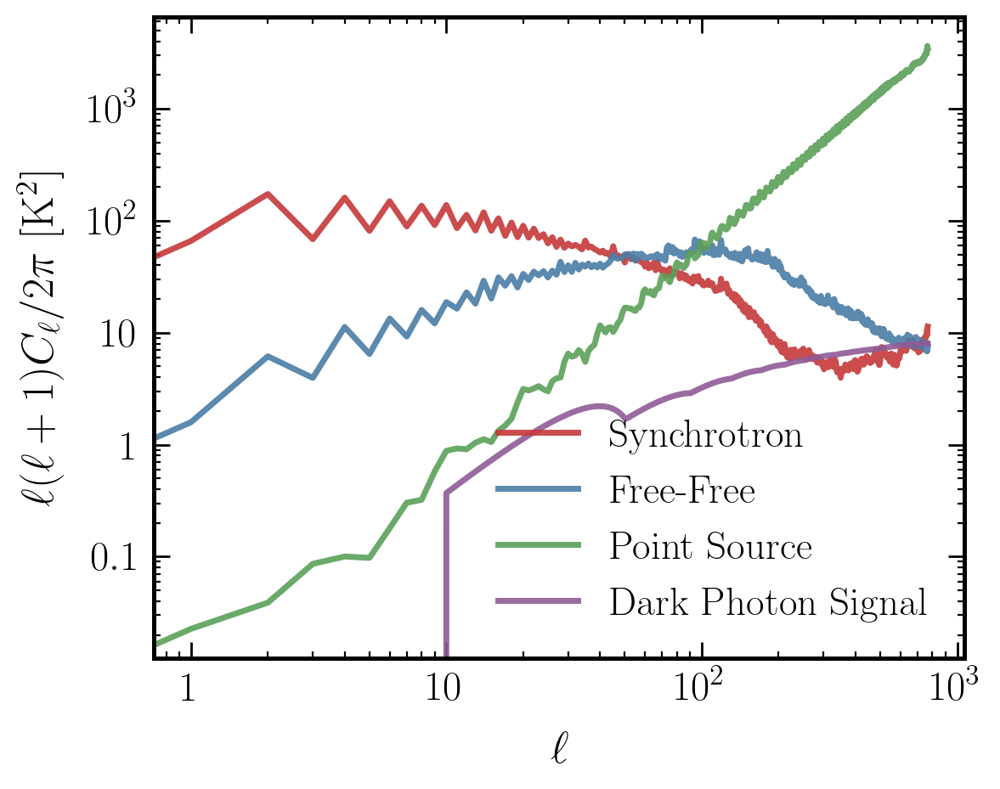

In [ ]:
sync_Cls = np.array([hp.sphtfunc.anafast(sync_maps[i], lmax=3*nside-1) for i in range(len(nu_centers))])
freefree_Cls = np.array([hp.sphtfunc.anafast(freefree_maps[i], lmax=3*nside-1) for i in range(len(nu_centers))])
point_Cls = np.array([hp.sphtfunc.anafast(point_source_maps[i], lmax=3*nside-1) for i in range(len(nu_centers))])
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * sync_Cls[4]/1000**2, label="Synchrotron")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * freefree_Cls[4]/1000**2, label="Free-Free")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * point_Cls[4]/1000**2, label="Point Source")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * interp_dp_Cls(full_ls)*epsilon**4 *ai(nu_centers[4]/u.MHz)**2, label="Dark Photon Signal")
plt.legend()
plt.xlabel(r"$\ell$")
plt.ylabel(r"$\ell(\ell+1)C_\ell/2\pi$ [K$^2$]")

In [ ]:
noise_maps = np.sum([point_source_maps, freefree_maps, sync_maps], axis=0) #* u.mK_CMB
total_map = np.sum([noise_maps, dp_maps], axis=0) #* u.mK_CMB
FWHM = np.radians(30/3600)
total_map = np.array([hp.smoothing(total_map[i, :], fwhm=FWHM) for i in range(len(nu_centers))]) 

masked_sync  = np.where(total_map  > np.mean(total_map, axis=1)[:, None] + 7 * np.std(total_map, axis=1)[:, None], 
                       np.mean(total_map, axis=1)[:, None] + 1 * np.std(total_map, axis=1)[:, None], 
                      sync_maps)
masked_sync[:, bool_map] = hp.UNSEEN
masked_sync_Cls = np.array([hp.sphtfunc.anafast(masked_sync[i], lmax=3*nside-1) for i in range(len(nu_centers))])

masked_freefree  = np.where(total_map  > np.mean(total_map, axis=1)[:, None] + 2 * np.std(total_map, axis=1)[:, None], 
                       np.mean(total_map, axis=1)[:, None] + 1 * np.std(total_map, axis=1)[:, None], 
                      freefree_maps)

masked_freefree[:, bool_map] = hp.UNSEEN
masked_freefree_Cls = np.array([hp.sphtfunc.anafast(masked_freefree[i], lmax=3*nside-1) for i in range(len(nu_centers))])

masked_point  = np.where(total_map  > np.mean(total_map, axis=1)[:, None] + 2 * np.std(total_map, axis=1)[:, None], 
                       np.mean(total_map, axis=1)[:, None] + 1 * np.std(total_map, axis=1)[:, None], 
                      point_source_maps/u.mK_CMB)
masked_point[:, bool_map] = hp.UNSEEN
masked_point_Cls = np.array([hp.sphtfunc.anafast(masked_point[i], lmax=3*nside-1) for i in range(len(nu_centers))])

(100, 1000)

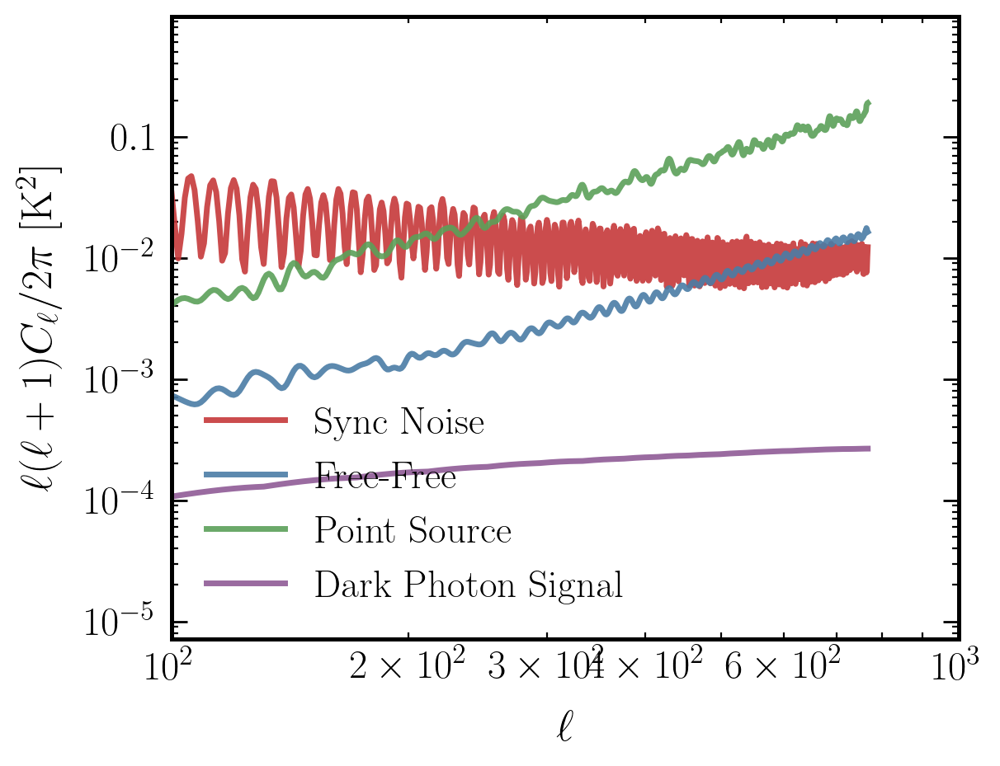

: 

In [ ]:
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * (masked_sync_Cls[4])/1000**2, label="Sync Noise")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * masked_freefree_Cls[4]/1000**2, label="Free-Free")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * masked_point_Cls[4]/1000**2, label="Point Source")
plt.loglog(full_ls, full_ls * (full_ls +1 ) / 2 / np.pi * interp_dp_Cls(full_ls)*(1e-6)**4 *ai(nu_centers[4]/u.MHz), label="Dark Photon Signal")
# plt.loglog(binning.get_effective_ells(),1e9* binning.get_effective_ells() * (binning.get_effective_ells() +1 ) / 2 / np.pi * clean_Cls , label="Cleaned Map")

plt.legend()
plt.xlabel(r"$\ell$")
plt.ylabel(r"$\ell(\ell+1)C_\ell/2\pi$ [K$^2$]")
plt.xlim(100, 1000)